# Data Visualisation of Elected Representatives

### Imports and defaults

In [31]:
import pandas as pd
import altair as alt
import geopandas as gp
import numpy as np
import json
import re
import matplotlib.pyplot as plt
from bokeh.io import output_notebook,show,output_file
from bokeh.plotting import figure
from bokeh.palettes import brewer
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, HoverTool, Select
from bokeh.layouts import WidgetBox
from IPython.display import Image
import seaborn as sns
pd.set_option('display.max_columns',21)

## Reading files

In [32]:
data=pd.read_csv('LS_2.0.csv')
india=gp.read_file('india_pc_2019_simplified.geojson')

FileNotFoundError: [Errno 2] File LS_2.0.csv does not exist: 'LS_2.0.csv'

## Basic preprocessing

In [4]:
def pre_proc(data,india):

    names=['pc_name','geometry']
    india=india[names]
    india['pc_name']=india['pc_name'].apply(lambda x: x.lower())
    data=data.rename({'CONSTITUENCY':'NAME_2','CRIMINAL\nCASES':'crime','TOTAL\nVOTES':'votes','OVER TOTAL VOTES POLLED \nIN CONSTITUENCY':'total_votes'},axis=1)
    data=data[data['WINNER']==1]
    data['NAME_2']=data['NAME_2'].apply(lambda x: x.lower())
    data['ASSETS']=data['ASSETS'].apply(lambda x: x.rsplit("\n"))
    data['ASSETS']=data'ASSETS'].apply(lambda x: x[0])
    data['ASSETS']=data['ASSETS'].apply(lambda x: re.sub(pattern=r"\D",repl="",string=str(x)))
    
    return data,india

In [7]:

data,india=pre_proc(data,india)

merged=india.merge(data,left_on='pc_name',right_on='NAME_2',how='left')




In [8]:
merged.head()

,pc_name,geometry,STATE,NAME_2,NAME,WINNER,PARTY,SYMBOL,GENDER,crime,AGE,CATEGORY,EDUCATION,ASSETS,LIABILITIES,GENERAL\nVOTES,POSTAL\nVOTES,votes,OVER TOTAL ELECTORS \nIN CONSTITUENCY,total_votes,TOTAL ELECTORS
0,kangra,"MULTIPOLYGON (((76.57700 33.20600, 76.59800 33...",Himachal Pradesh,kangra,Kishan Kapoor,1.0,BJP,Lotus,MALE,2,67.0,ST,12th Pass,85841247,"Rs 36,05,161\n ~ 36 Lacs+",712133.0,13085.0,725218.0,50.809129,71.835341,1427338.0
3,mandi,"MULTIPOLYGON (((76.79500 33.25600, 76.82000 33...",Himachal Pradesh,mandi,RAM SWAROOP SHARMA,1.0,BJP,Lotus,MALE,0,60.0,GENERAL,10th Pass,15724337,"Rs 7,83,963\n ~ 7 Lacs+",638441.0,8748.0,647189.0,50.503956,68.620089,1281462.0
6,hamirpur,"MULTIPOLYGON (((76.02000 32.14000, 76.04300 32...",Himachal Pradesh,hamirpur,ANURAG SINGH THAKUR,1.0,BJP,Lotus,MALE,3,44.0,GENERAL,Graduate,56770463,"Rs 10,85,145\n ~ 10 Lacs+",668812.0,13880.0,682692.0,50.114331,68.813723,1362269.0
7,hamirpur,"MULTIPOLYGON (((76.02000 32.14000, 76.04300 32...",Uttar Pradesh,hamirpur,KUNWAR PUSHPENDRA SINGH CHANDEL,1.0,BJP,Lotus,MALE,4,45.0,GENERAL,Post Graduate,167159924,"Rs 3,55,02,582\n ~ 3 Crore+",574101.0,1021.0,575122.0,32.881025,52.762082,1749100.0
13,shimla,"MULTIPOLYGON (((78.09400 31.41900, 78.16200 31...",Himachal Pradesh,shimla,SURESH KUMAR KASHYAP,1.0,BJP,Lotus,MALE,0,48.0,SC,Post Graduate,15705738,"Rs 78,73,806\n ~ 78 Lacs+",601305.0,4877.0,606182.0,48.144645,66.238613,1259085.0


# Constituency

The following is a chart of the electorates of India categorised by party which holds authority in them.

In [9]:
def constituency_chart(merged):
    india=alt.Chart(merged).mark_geoshape()
    
    input_dropdown=alt.binding_select(options=np.unique(merged['PARTY']))
    selection_votes=alt.selection_single(fields=['PARTY'], bind=input_dropdown,name='Constituencies of')
    color_votes=alt.condition(selection_votes,alt.Color('PARTY:N'),alt.value('lightgrey'))
    
    cons=india.encode(
    color=color_votes,tooltip=['PARTY','total_votes:Q']).add_selection(
    selection_votes).properties(
    height=600,width=600,title='Percentage of votes').configure_title(
    fontSize=30,font='Courier',color='gray')
    
    return cons

In [10]:
constituency_chart(merged)

alt.Chart(...)

# Criminal Records

Politics and Crime have gone hand in hand since a long time despite the fact that the former profession is about 
collective development and societal harmony. 

The following chart depicts the number of criminal charges against the candidates by the constituencies and also the bar chart identifies parties that field candidates with criminal records as a sum of total cases per party.

In [11]:
def criminal_cases(merged):
    crime=alt.Chart(merged).mark_geoshape(stroke='lightgrey')
    
    party=alt.Chart(merged).mark_bar()
    
    selection1=alt.selection_multi(fields=['PARTY:N'], name='Constituencies of')
    
    color_votes=alt.condition(selection1,alt.Color('crime:Q',legend=None),alt.value('white'),)
    
    selection=alt.selection_multi(fields=['PARTY'],name='Constituencies of')
    
    color_bar=alt.condition(selection,alt.Color('sum(crime):Q',legend=None),alt.value('black'))
    
    crimes=crime.encode(
        color=color_votes,tooltip=['NAME:N','PARTY:N','NAME_2','crime:Q']).add_selection(
        selection1
        ).properties(
        height=800,width=600,title='Criminal Charges')
    legend=party.encode(
        color=color_bar,
        y=alt.Y('PARTY:N'),
        x=alt.X('sum(crime):Q')).add_selection(
        selection)
    
    return crimes|legend


In [12]:
criminal_cases(merged)

alt.HConcatChart(...)

### Conclusion: Stronger review of candidates. Judicial review for unreasonable number of cases.

## Affirmitive Action

India provides reservation to few communities based on their caste. This ensures representation and oppurtunity that was historically denied.

#### Percentage of representation

In [13]:
def age_pie(merged):
    gen_cou=dict(merged['CATEGORY'].value_counts())
    sizes=gen_cou.values()
    labels=gen_cou.keys()
    explode=[0,0.1,0.2]
    plt.figure(figsize=[20,15])
    fig1, ax1 = plt.subplots()
    ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
            shadow=True, startangle=90)
    ax1.axis('equal')
    plt.title('Percentage of representation by caste')
    plt.show()

<Figure size 1440x1080 with 0 Axes>

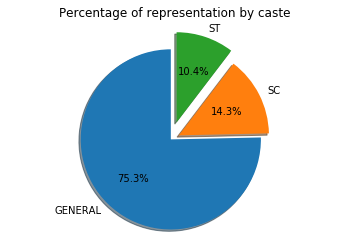

In [14]:
age_pie(merged)

## Constituencies 

In [15]:
def affirmitive_action(merged):
    cat=alt.Chart(merged).mark_geoshape()

    affirm=cat.encode(
        color=alt.Color('CATEGORY:N'),
        tooltip=['PARTY:N']).properties(
        height=800,width=800,title='Candidates Categories')
    
    return affirm

In [16]:
aff=affirmitive_action(merged)

In [17]:
aff

alt.Chart(...)

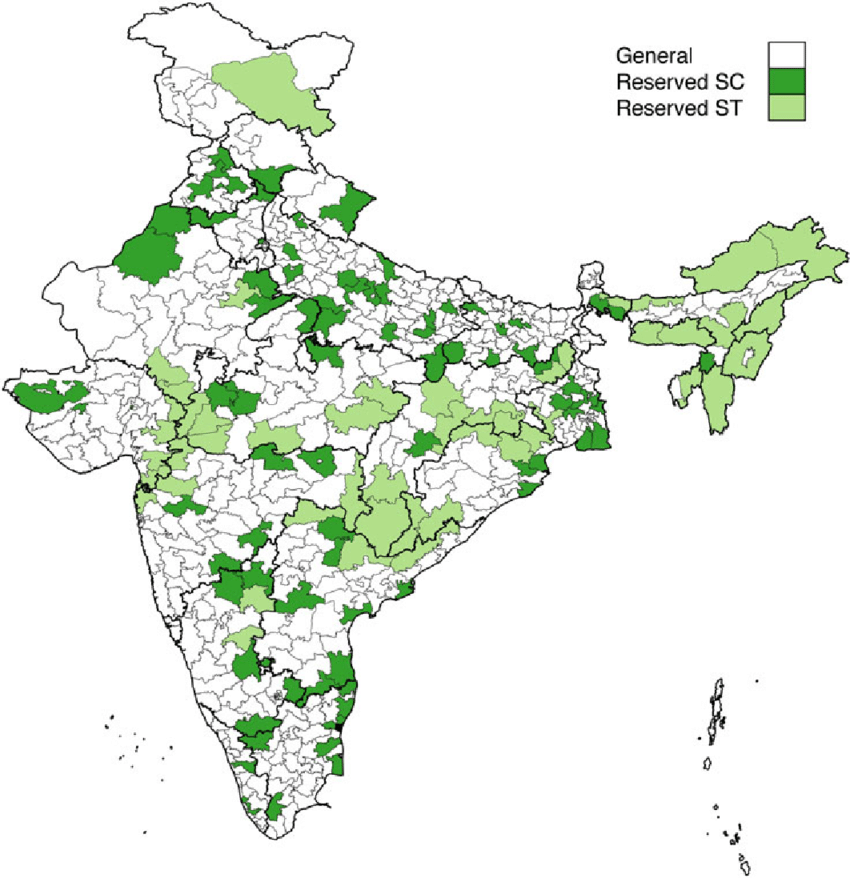

In [18]:
Image(filename='/Users/satyadev/Downloads/Parliamentary-constituencies-reserved-for-SCs-since-2008-Figure-created-by-author-using.png')

### Conclusion: Current model allows for seclusion of under privileged communities to stay isolated, in their respective constituencies. A model based on stationary and rotationary constituencies might play a role in help bring their representation to the mainstream politics and also desensitise the rest of the country.

# AGE

<module 'seaborn' from '/Users/satyadev/anaconda3/lib/python3.7/site-packages/seaborn/__init__.py'>

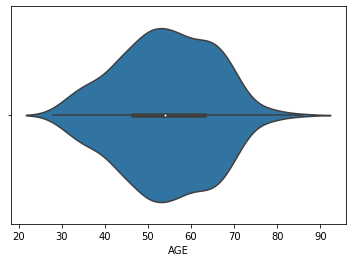

In [19]:
sns.violinplot(merged['AGE'])
sns

### Conclusion: Majority of the distribution is in the 50+ age group leading to a lack updation to changing norms.

# Gender 

In [20]:
def gender_pie(merged):
    gen_cou=dict(merged['GENDER'].value_counts())
    sizes=gen_cou.values()
    labels=gen_cou.keys()
    explode=[0,0.1]
    plt.figure(figsize=[20,15])
    fig1, ax1 = plt.subplots()
    ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
            shadow=True, startangle=90)
    ax1.axis('equal') 
    plt.show()

<Figure size 1440x1080 with 0 Axes>

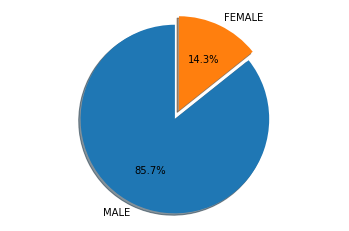

In [21]:
gender_pie(merged)

### Conclusion: Apart from the skewed distribution, there is also no represntation from the LGBTQ+ community diminishing their say in laws pertaining to their rights.

## Gender distribution Constituency wise

In [22]:
def gender(merged):
    gen=alt.Chart(merged).mark_geoshape()

    gender=gen.encode(
        color=alt.Color('GENDER:N'),
        tooltip=['PARTY:N','NAME:N']).properties(
        height=800,width=800,title='Candidates Categories')
    
    return gender

In [23]:
gender(merged)

alt.Chart(...)

## Gender and Caste

In [24]:
def gender_caste(merged):
    crime=alt.Chart(merged).mark_geoshape(stroke='lightgrey')
    
    party=alt.Chart(merged).mark_bar()
    
    selection1=alt.selection_multi(fields=['GENDER:N'],name='Gender')
    
    color_votes=alt.condition(selection1,alt.Color('CATEGORY:N'),alt.value('white'),)
    
    selection=alt.selection_multi(fields=['GENDER'],name='Gender')
    
    color_bar=alt.condition(selection,alt.Color('count(GENDER):Q',legend=None),alt.value('black'))
    
    crimes=crime.encode(
        color=color_votes,tooltip=['NAME:N','PARTY:N','NAME_2','crime:Q']).add_selection(
        selection1
        ).properties(
        height=800,width=600,title='Criminal Charges')
    legend=party.encode(
        color=color_bar,
        y=alt.Y('GENDER:N'),
        x=alt.X('count(GENDER):Q')).add_selection(
        selection)
    
    return crimes|legend



In [25]:
gender_caste(merged)

alt.HConcatChart(...)

### Conclusion: Lack of representation in both the gender is further amplified in the category of caste. This ensures a system where most under represented, underprivileged women, are barely heard. The Reservation bill for women must also address this issue, if indeed it ever gets passed.

# ASSETS

Although it is evident from the atmosphere that elections are a fiscal game, the following analysis shows the extent to which the distribution is skewed. The y axis is has been scaled logarithmically.

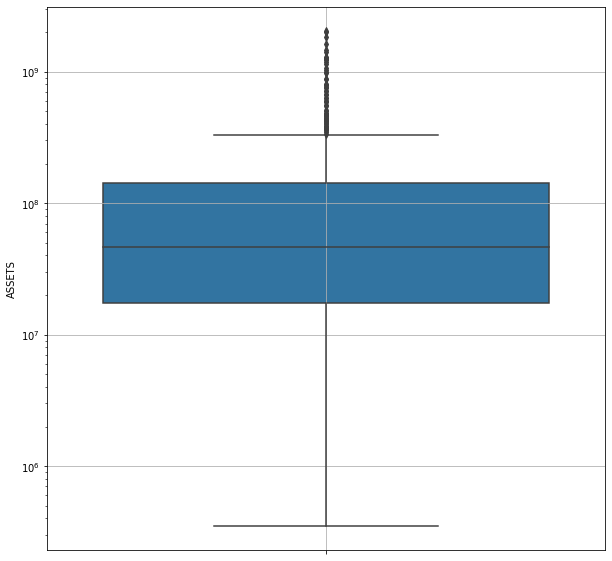

In [33]:
plt.figure(figsize=[10,10])
sns.boxplot(merged['ASSETS'].astype('int32'),orient='v')
plt.yscale('log')
plt.grid()
plt.show()

#### An Age vs Assets boxplot

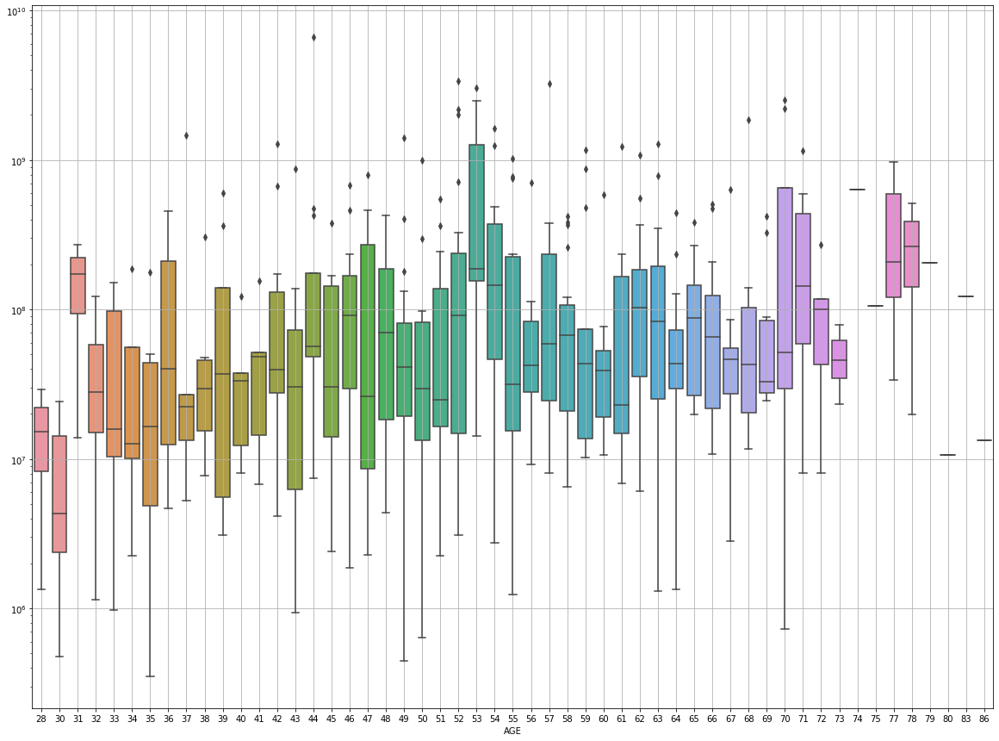

In [27]:
me=np.array(merged['ASSETS']).astype('float64')
plt.figure(figsize=[20,15])
sns.boxplot(y=me,x=merged['AGE'].astype('int32'),orient='v')
plt.yscale('log')
plt.grid()
plt.show()

### Conclusion: Assets and age seemingly have a linear relationship.

## Assest distribution

In [28]:
def assets(merged):  
    merged_json=json.loads(merged.to_json())
    jsondata=json.dumps(merged_json)
    geosource=GeoJSONDataSource(geojson=jsondata)



    palette=brewer['PuBu'][9]
    palette=palette[::-1]
    color_mapper=LinearColorMapper(palette=palette,low=0,high=100000000,nan_color='#000000')
    color_bar=ColorBar(color_mapper=color_mapper,label_standoff=20,height=20,width=300, border_line_color=None,location = (0,0), orientation = 'horizontal')

    hover=HoverTool(tooltips=[('Name: ','@NAME'),('PARTY','@PARTY'),('ASSETS','@ASSETS')])

    p=figure(title='DECLARED ASSETS',plot_height = 800 , plot_width = 800, toolbar_location = None,tools=[hover])
    p.patches('xs','ys',source=geosource,fill_color={'field':'ASSETS','transform':color_mapper},line_color='black',line_width=0.2,fill_alpha=1)
    p.add_layout(color_bar,'below')

    output_notebook()
    show(p)

In [29]:
assets(merged)

Loading BokehJS ...